# PROBLEM STATEMENT

<h4>
<i>    
A marketing agency has many customers that use their service to produce ads for the client/customer websites. 
<br>
    
    
They've noticed that they have quite a bit of churn in clients. They basically randomly assign account managers right now, but want you to create a machine learning model that will help predict which customers will churn (stop buying their service) so that they can correctly assign the customers most at risk to churn an account manager. 
    
Luckily they have some historical data, can you help them out? Create a classification algorithm that will help classify whether or not a customer churned. Then the company can test this against incoming data for future customers to predict which customers will churn and assign them an account manager.</i></h4>

In [109]:
# Installed These Libraries

# pip install seaborn
# pip install -U scikit-learn
# pip install matplotlib

# Step 1 - Collecting the Dataset

In [110]:
# importing necessary Libraries

import numpy as np # for array(vector) operations
import pandas as pd # for data manipulation, reading, writing, inserting, deleting

#For Pllotting Graphs
import seaborn as sns
import matplotlib.pyplot as plt
import math
%matplotlib inline

# for model selection, accuracy
import sklearn


In [111]:
# reading .csv file
dataset = pd.read_csv("customer_churn.csv")

In [112]:
dataset

,Names,Age,Total_Purchase,Account_Manager,Years,Num_Sites,Onboard_date,Location,Company,Churn
0,Cameron Williams,42.0,11066.80,0,7.22,8.0,2013-08-30 07:00:40,"10265 Elizabeth Mission Barkerburgh, AK 89518",Harvey LLC,1
1,Kevin Mueller,41.0,11916.22,0,6.50,11.0,2013-08-13 00:38:46,"6157 Frank Gardens Suite 019 Carloshaven, RI 1...",Wilson PLC,1
2,Eric Lozano,38.0,12884.75,0,6.67,12.0,2016-06-29 06:20:07,"1331 Keith Court Alyssahaven, DE 90114","Miller, Johnson and Wallace",1
3,Phillip White,42.0,8010.76,0,6.71,10.0,2014-04-22 12:43:12,"13120 Daniel Mount Angelabury, WY 30645-4695",Smith Inc,1
4,Cynthia Norton,37.0,9191.58,0,5.56,9.0,2016-01-19 15:31:15,"765 Tricia Row Karenshire, MH 71730",Love-Jones,1
...,...,...,...,...,...,...,...,...,...,...
895,Paul Miller,42.0,12800.82,1,3.62,8.0,2007-12-01 13:29:34,"9316 Julian Fort Suite 328 North Leslie, ME 43961",Evans-Lucero,0
896,Natalie Hodges,52.0,9893.92,0,6.91,7.0,2008-12-28 15:23:58,"8419 William Square Apt. 695 Martinville, RI 3...",Perry and Sons,0
897,Ana Smith,45.0,12056.18,0,5.46,4.0,2014-06-20 05:10:09,Unit 8633 Box 8738 DPO AA 14126-5026,Schneider-Smith,0
898,Justin Leonard,51.0,6517.93,1,5.47,10.0,2012-05-30 00:15:43,"49800 Torres Ways Suite 886 West Bradleybury, ...",Robles-Abbott,0


In [113]:
dataset.columns

Index(['Names', 'Age', 'Total_Purchase', 'Account_Manager', 'Years',
       'Num_Sites', 'Onboard_date', 'Location', 'Company', 'Churn'],
      dtype='object')

# Step 2: PreProcessing and Analyzing The Dataset

In [114]:
# Checking for null(NaN) values
dataset.isnull().sum()

Names              0
Age                0
Total_Purchase     0
Account_Manager    0
Years              0
Num_Sites          0
Onboard_date       0
Location           0
Company            0
Churn              0
dtype: int64

In [115]:
# We Can fecth the Onboard year
# starting_year = int((dataset['Onboard_date'][0])[0:4])

In [116]:
# checking for any duplicate rows
dataset.duplicated().any()

False

In [117]:
# checking the columns Names, Onboard_date, Location

<Axes: xlabel='Churn', ylabel='count'>

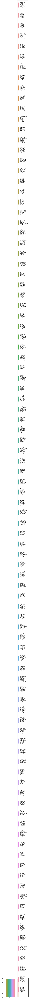

In [118]:
# Plotting the different types of names or frequency of each unique name
sns.countplot(x="Churn", hue="Names", data = dataset)

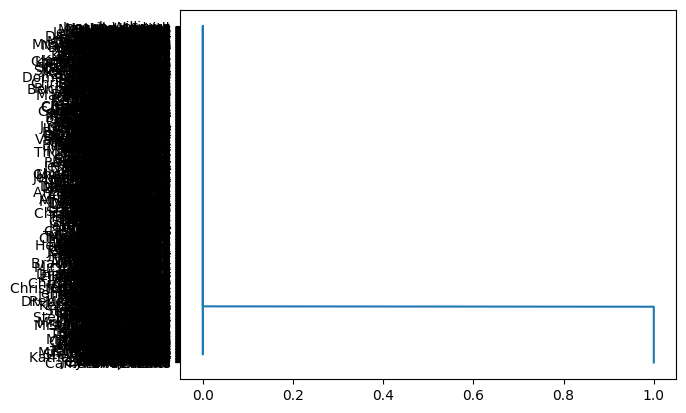

In [119]:
# 2d plot x-axis : Churn Column, y-axis : Names Column 
plt.plot(dataset['Churn'], dataset['Names'])

<Axes: xlabel='Churn', ylabel='count'>

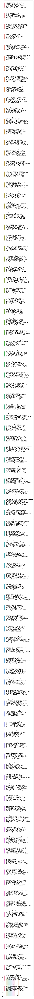

In [120]:
# Now Doing the same for location
sns.countplot(x="Churn", hue="Location", data = dataset)

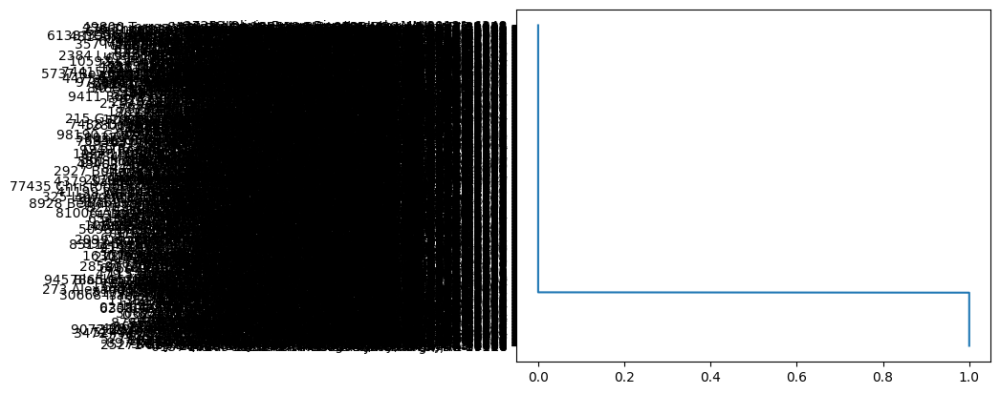

In [121]:
plt.plot(dataset['Churn'], dataset['Location'])

<Axes: xlabel='Churn', ylabel='count'>

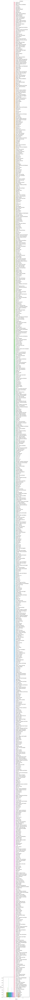

In [122]:
# Now Doing the same for Company Column
sns.countplot(x="Churn", hue="Company", data = dataset)

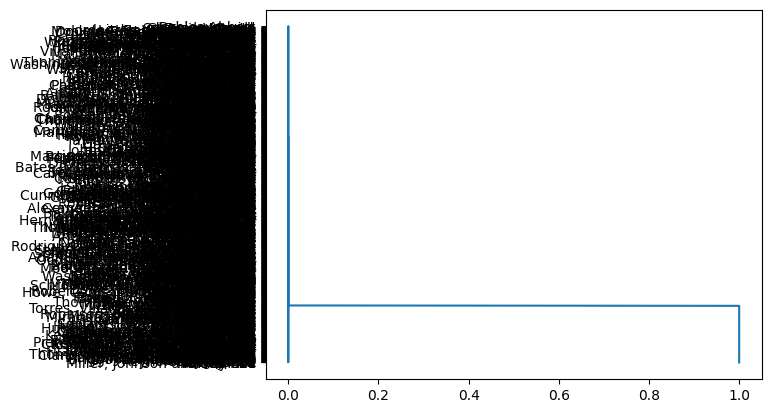

In [123]:
plt.plot(dataset['Churn'], dataset['Company'])

In [124]:
# As we can we can see that the Columns : Company, Names, Location variation is large 
# as there are almost all unique values in these columns.
# So these  columns will not Affect the Churn Column

In [125]:
# No. of rows in Dataset
dataset.shape[0]

900

In [126]:
# Unique values in Names Column
print(f"No. of uniques values in Names Column :{len(dataset['Names'].unique())}")
print(f"No. of uniques values in Company Column :{len(dataset['Company'].unique())}")
print(f"No. of uniques values in Location Column :{len(dataset['Location'].unique())}")

No. of uniques values in Names Column :899
No. of uniques values in Company Column :873
No. of uniques values in Location Column :900


In [127]:
# Since we have a years column so we also don't need Onboard_date column

In [128]:
# Dropping unnecessary Columns
dataset = dataset.drop(columns=['Names','Onboard_date','Location','Company'])

In [129]:
# Now the New dataset will look like this
dataset

,Age,Total_Purchase,Account_Manager,Years,Num_Sites,Churn
0,42.0,11066.80,0,7.22,8.0,1
1,41.0,11916.22,0,6.50,11.0,1
2,38.0,12884.75,0,6.67,12.0,1
3,42.0,8010.76,0,6.71,10.0,1
4,37.0,9191.58,0,5.56,9.0,1
...,...,...,...,...,...,...
895,42.0,12800.82,1,3.62,8.0,0
896,52.0,9893.92,0,6.91,7.0,0
897,45.0,12056.18,0,5.46,4.0,0
898,51.0,6517.93,1,5.47,10.0,0


<Axes: xlabel='Churn', ylabel='count'>

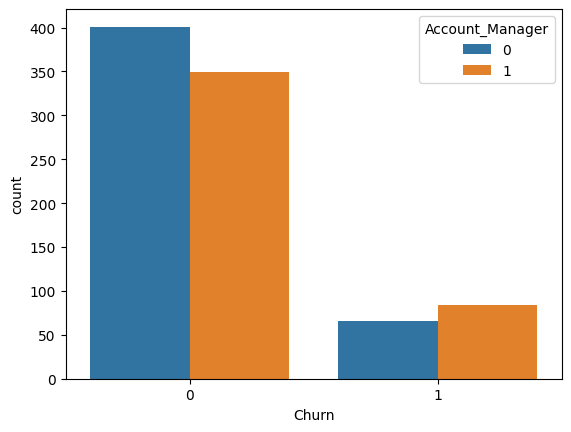

In [130]:
# Checking the plot between Churn and Account_Manager Column
sns.countplot(x="Churn", hue="Account_Manager", data = dataset)

# Train Data

In [131]:
# Indepent variable
X = dataset.drop("Churn", axis=1)

# Dependent variable
y = dataset['Churn']

In [132]:
# For Creating Train and test dataset we have to import train_test_split from sklearn
from sklearn.model_selection import train_test_split

In [133]:
# test_size - Proportion of dataset that is taken
# random state - for shufflinf dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [134]:
# importing LogisticRegression Algorithm
from sklearn.linear_model import LogisticRegression

# default parameter selection
classifier = LogisticRegression()

In [135]:
# Fitting our dataset into the Logistic Regression model
classifier.fit(X_train, y_train)

LogisticRegression()

In [136]:
# Prediction
y_pred = classifier.predict(X_test)

In [137]:
# Checking Accuracy Score
from sklearn.metrics import accuracy_score, classification_report

In [138]:
accuracy = accuracy_score(y_pred, y_test)

In [139]:
accuracy

0.8383838383838383

Accuracy is around 83.83%. Now let's try changing some parameters rather than the default parameter

In [140]:
# Now setting some parameters Manually

In [141]:
# GridSearchCV is a Technique for finding the optimal parameters values from a given set of partameters
from sklearn.model_selection import GridSearchCV

# penalty is for shrinking the less contributive variables to zero => regularization
# C = inverse of regularization parameter
# max_iter = maximum number of iterations

parameter = {'penalty':['l1','l2','elasticnet'], 'C':[1,2,3,4,5,6,7,8,9],'max_iter':[100,200,300]}

In [142]:
# estimator is the algorithm that is going to be used
# param_grid = all parameters

# scoring is the accuracy
# cv = Cross Validation 
classifier_regression = GridSearchCV(classifier, param_grid=parameter, scoring='accuracy', cv=5)

In [143]:
classifier_regression.fit(X_train, y_train)

C:\Users\t-dhkumar\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\t-dhkumar\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/l

C:\Users\t-dhkumar\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
270 fits failed out of a total of 405.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
135 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\t-dhkumar\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\t-dhkumar\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  F

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             scoring='accuracy')

In [144]:
classifier_regression

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             scoring='accuracy')

In [145]:
# now let's see which best parameter is selected

# can only see if we have selected refit parameter in GridSearchCV
print(classifier_regression.best_params_)

{'C': 1, 'max_iter': 200, 'penalty': 'l2'}


In [146]:
print(classifier_regression.best_score_)

0.8723829201101928


In [147]:
# prediction
y_pred2 = classifier_regression.predict(X_test)

In [148]:
# Accuracy
score2 = accuracy_score(y_pred2, y_test)

In [149]:
score2

0.8383838383838383